# Stable Diffusion

Textual Inversion is a training technique for personalizing image generation models with just a few example images of what you want it to learn. This technique works by learning and updating the text embeddings (the new embeddings are tied to a special word you must use in the prompt) to match the example images you provide.
https://huggingface.co/docs/diffusers/en/training/text_inversion | arxiv:2208.01618

In [1]:
import os

# Set the environment variable as a fallback for MPS (Apple Silicon)
os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = '1' 

In [2]:
import os
import torch
import PIL
from PIL import Image
from diffusers import StableDiffusionPipeline, DiffusionPipeline
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer
import numpy as np
import cv2
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import torchvision.transforms as T
elastic_transformer = T.ElasticTransform(alpha=550.0,sigma=5.0)
import gc
import torch.nn.functional as F

/Users/peeyush.singhal/Library/CloudStorage/OneDrive-TomTom/stable_diffusion/sdenv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
torch_device        = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
height, width       = 512, 512
guidance_scale      = 8
loss_scale          = 200
num_inference_steps = 50
batch_size          = 1

In [4]:
pretrained_model_name_or_path = "CompVis/stable-diffusion-v1-4"
pipe = DiffusionPipeline.from_pretrained(
    pretrained_model_name_or_path,
    torch_dtype=torch.float16
).to(torch_device)

Loading pipeline components...: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


# Functions

In [5]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

def image_loss(images,loss_type):
    
    if loss_type == 'blue':
        # blue loss
        error = torch.abs(images[:,2] - 0.9).mean() # [:,2] -> all images in batch, only the blue channel
    elif loss_type == 'elastic':
        # elastic loss
        transformed_imgs = elastic_transformer(images) # 2,3,512,512
        error = torch.abs(transformed_imgs - images).mean()    
    elif loss_type == 'symmetry':
        flipped_image = torch.flip(images, [3])
        error = F.mse_loss(images, flipped_image)
    elif loss_type == 'saturation':
        # saturation loss
        transformed_imgs = T.functional.adjust_saturation(images,saturation_factor = 10)
        error = torch.abs(transformed_imgs - images).mean()
    else:
        print("error. Loss not defined")

    return error

def latents_to_pil(latents):
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = pipe.vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1) # 0 to 1
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

In [6]:
def generate_image(seed_no,prompts,loss_type,loss_apply=False):
    
    generator           = torch.manual_seed(seed_no)
    
    # scheduler
    scheduler    = LMSDiscreteScheduler(beta_start = 0.00085, beta_end = 0.012, beta_schedule = "scaled_linear", num_train_timesteps = 1000)
    scheduler.set_timesteps(num_inference_steps)
    scheduler.timesteps = scheduler.timesteps.to(torch.float32)

    # text embeddings of the prompt
    text_input = pipe.tokenizer(prompts, padding='max_length', max_length = pipe.tokenizer.model_max_length, truncation= True, return_tensors="pt")
    input_ids = text_input.input_ids.to(torch_device)

    with torch.no_grad():
        text_embeddings = pipe.text_encoder(text_input.input_ids.to(torch_device))[0]

    max_length = text_input.input_ids.shape[-1]
    uncond_input = pipe.tokenizer(
          [""] * batch_size, padding="max_length", max_length= max_length, return_tensors="pt"
    )

    with torch.no_grad():
        uncond_embeddings = pipe.text_encoder(uncond_input.input_ids.to(torch_device))[0]

    text_embeddings = torch.cat([uncond_embeddings,text_embeddings]) # 2,77,768

    # random latent
    latents = torch.randn(
        (batch_size, pipe.unet.config.in_channels, height// 8, width //8),
        generator = generator,
    ) .to(torch.float16)


    latents = latents.to(torch_device)
    latents = latents * scheduler.init_noise_sigma

    for i, t in tqdm(enumerate(scheduler.timesteps), total = len(scheduler.timesteps)):

        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        with torch.no_grad():
            noise_pred = pipe.unet(latent_model_input.to(torch.float16), t, encoder_hidden_states=text_embeddings)["sample"]
            #noise_pred = pipe.unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        if loss_apply and i%5 == 0: 
            
            latents = latents.detach().requires_grad_()
            #latents_x0 = scheduler.step(noise_pred,t, latents).pred_original_sample # this line does not work
            latents_x0 = latents - sigma * noise_pred

            # use vae to decode the image
            denoised_images = pipe.vae.decode((1/ 0.18215) * latents_x0).sample / 2 + 0.5 # range(0,1)

            loss = image_loss(denoised_images,loss_type) * loss_scale
            print(f"loss {loss}")
            
            cond_grad = torch.autograd.grad(loss, latents)[0]
            latents = latents.detach() - cond_grad * sigma**2

        latents = scheduler.step(noise_pred,t, latents).prev_sample
        
    return latents

The below may need export PYTORCH_ENABLE_MPS_FALLBACK=1

In [7]:
import os

# Set the environment variable
os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = '1'


In [8]:
# Load SD concepts
sdconcepts = ['<meeg>', '<midjourney-style>', '<moebius>', ' <Marc_Allante>', '<wlop-style>'] 

pipe.load_textual_inversion("sd-concepts-library/dreams", mean_resizing=False) 
pipe.load_textual_inversion("sd-concepts-library/midjourney-style", mean_resizing=False) 
pipe.load_textual_inversion("sd-concepts-library/moebius", mean_resizing=False) 
pipe.load_textual_inversion("sd-concepts-library/style-of-marc-allante", mean_resizing=False) 
pipe.load_textual_inversion("sd-concepts-library/wlop-style", mean_resizing=False)

# define seeds
seed_list = [2000,2000,500,600,100]

The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`
/Users/peeyush.singhal/Library/CloudStorage/OneDrive-TomTom/stable_diffusion/sdenv/lib/python3.9/site-packages/transformers/modeling_utils.py:2415: UserWarning: The operator 'aten::_linalg_eigvals' is not currently supported on the MPS backend and will fall back to run on the CPU. This may have performance implications. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/mps/MPSFallback.mm:13.)
  eigenvalues = torch.linalg.eigvals(covariance)


# Prompt


In [9]:
prompt  = """Boy with a cowboy hat in the style of"""

# Image without loss

100%|██████████| 50/50 [00:51<00:00,  1.02s/it]


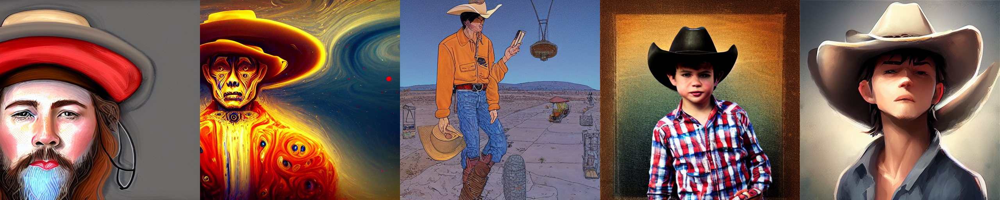

In [10]:
latents_collect = [] 
loss_type = 'N/A'
for seed_no,sd in zip(seed_list,sdconcepts):
    
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()
    
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no, prompts,loss_type,loss_apply=False)
    latents_collect.append(latents)
    
# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

# WARNING: 
Due to non support of MPS for loss calculations, the calculations happen on CPU and it will be slow. It is recommended to use GPU for faster calculations.

# Images with elastic loss applied every 5 step



  0%|          | 0/50 [00:00<?, ?it/s]

loss 7.0


 10%|█         | 5/50 [06:12<46:07, 61.50s/it]   

loss 9.4375


 20%|██        | 10/50 [12:12<43:38, 65.46s/it]

loss 12.5703125


 30%|███       | 15/50 [20:44<55:30, 95.15s/it]

loss 12.1328125


 40%|████      | 20/50 [26:03<28:26, 56.89s/it] 

loss 11.5078125


 50%|█████     | 25/50 [30:38<20:32, 49.31s/it]

loss 11.7734375


 60%|██████    | 30/50 [35:42<18:10, 54.53s/it]

loss 11.7890625


 70%|███████   | 35/50 [41:02<14:04, 56.27s/it]

loss 12.1015625


 80%|████████  | 40/50 [46:45<10:43, 64.36s/it]

loss 12.7421875


 90%|█████████ | 45/50 [50:11<03:12, 38.47s/it]

loss 13.328125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 4.94921875


 10%|█         | 5/50 [05:15<36:03, 48.07s/it]   

loss 6.70703125


 20%|██        | 10/50 [09:30<26:37, 39.95s/it]

loss 7.21875


 30%|███       | 15/50 [11:13<12:33, 21.53s/it]

loss 8.5625


 40%|████      | 20/50 [13:30<12:28, 24.96s/it]

loss 8.828125


 50%|█████     | 25/50 [15:29<08:35, 20.62s/it]

loss 11.953125


 60%|██████    | 30/50 [16:54<05:37, 16.86s/it]

loss 13.125


 70%|███████   | 35/50 [18:01<03:14, 12.99s/it]

loss 11.6171875


 80%|████████  | 40/50 [35:01<49:33, 297.38s/it]

loss 11.6953125


 90%|█████████ | 45/50 [35:54<04:31, 54.39s/it] 

loss 12.0859375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 12.515625


 10%|█         | 5/50 [00:21<02:06,  2.82s/it]

loss 13.71875


 20%|██        | 10/50 [01:16<07:14, 10.85s/it]

loss 15.46875


 30%|███       | 15/50 [01:43<02:34,  4.43s/it]

loss 19.078125


 40%|████      | 20/50 [01:59<01:50,  3.68s/it]

loss 24.03125


 50%|█████     | 25/50 [03:53<06:54, 16.59s/it]

loss 22.734375


 60%|██████    | 30/50 [04:07<01:34,  4.75s/it]

loss 24.96875


 70%|███████   | 35/50 [04:26<00:44,  2.99s/it]

loss 27.34375


 80%|████████  | 40/50 [04:39<00:23,  2.33s/it]

loss 26.4375


 90%|█████████ | 45/50 [04:52<00:12,  2.44s/it]

loss 29.421875


  0%|          | 0/50 [00:00<?, ?it/s]

loss 7.05078125


 10%|█         | 5/50 [00:15<02:00,  2.68s/it]

loss 6.3828125


 20%|██        | 10/50 [00:28<01:26,  2.17s/it]

loss 9.4453125


 30%|███       | 15/50 [00:48<02:04,  3.55s/it]

loss 11.3828125


 40%|████      | 20/50 [01:06<01:34,  3.13s/it]

loss 10.1328125


 50%|█████     | 25/50 [01:26<01:20,  3.21s/it]

loss 11.0625


 60%|██████    | 30/50 [01:49<01:11,  3.58s/it]

loss 11.7109375


 70%|███████   | 35/50 [02:12<00:54,  3.63s/it]

loss 12.3671875


 80%|████████  | 40/50 [02:51<00:48,  4.80s/it]

loss 13.7578125


 90%|█████████ | 45/50 [03:09<00:16,  3.38s/it]

loss 14.4296875


  0%|          | 0/50 [00:00<?, ?it/s]

loss 9.7265625


 10%|█         | 5/50 [00:23<02:38,  3.51s/it]

loss 11.5625


 20%|██        | 10/50 [00:52<02:52,  4.31s/it]

loss 14.2578125


 30%|███       | 15/50 [01:15<02:10,  3.73s/it]

loss 15.7734375


 40%|████      | 20/50 [01:42<02:00,  4.01s/it]

loss 13.9296875


 50%|█████     | 25/50 [02:07<01:38,  3.92s/it]

loss 14.2578125


 60%|██████    | 30/50 [03:18<03:15,  9.76s/it]

loss 13.5859375


 70%|███████   | 35/50 [03:34<00:57,  3.84s/it]

loss 14.3828125


 80%|████████  | 40/50 [03:49<00:29,  2.91s/it]

loss 14.234375


 90%|█████████ | 45/50 [04:05<00:13,  2.78s/it]

loss 14.4921875


100%|██████████| 50/50 [04:22<00:00,  5.25s/it]


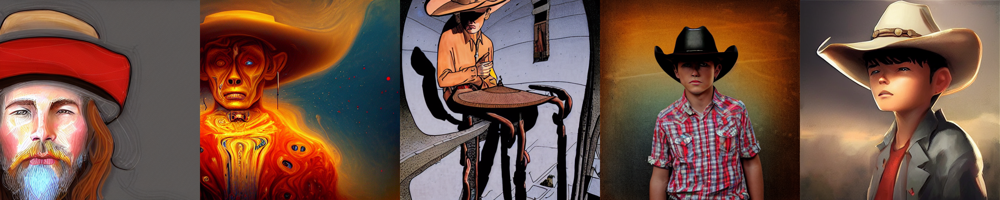

In [11]:
# after loss is applied
latents_collect = []
loss_type = 'elastic'
for seed_no,sd in zip(seed_list,sdconcepts):
    
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()
    
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)
    
# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

# Images with symmetry loss applied every 5 step


  0%|          | 0/50 [00:00<?, ?it/s]

loss 20.234375


 10%|█         | 5/50 [06:00<44:32, 59.38s/it]   

loss 44.375


 20%|██        | 10/50 [11:11<38:29, 57.73s/it] 

loss 13.953125


 30%|███       | 15/50 [15:51<28:34, 48.97s/it]

loss 9.1875


 40%|████      | 20/50 [19:54<21:25, 42.86s/it]

loss 9.921875


 50%|█████     | 25/50 [24:50<20:53, 50.12s/it]

loss 8.9140625


 60%|██████    | 30/50 [29:24<15:17, 45.85s/it]

loss 8.7109375


 70%|███████   | 35/50 [33:51<11:28, 45.87s/it]

loss 8.4375


 80%|████████  | 40/50 [38:55<09:36, 57.63s/it]

loss 8.625


 90%|█████████ | 45/50 [43:38<04:17, 51.44s/it]

loss 8.9453125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 13.28125


 10%|█         | 5/50 [20:21<1:42:28, 136.63s/it]  

loss 22.375


 20%|██        | 10/50 [25:05<39:27, 59.19s/it]  

loss 5.19921875


 30%|███       | 15/50 [29:37<28:53, 49.52s/it]

loss 4.5703125


 40%|████      | 20/50 [34:14<24:14, 48.47s/it]

loss 6.5


 50%|█████     | 25/50 [38:46<20:11, 48.47s/it]

loss 5.015625


 60%|██████    | 30/50 [43:32<16:10, 48.55s/it]

loss 4.45703125


 70%|███████   | 35/50 [48:28<12:19, 49.33s/it]

loss 4.234375


 80%|████████  | 40/50 [52:59<07:53, 47.37s/it]

loss 4.1015625


 90%|█████████ | 45/50 [57:21<04:01, 48.21s/it]

loss 4.0625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 11.6875


 10%|█         | 5/50 [04:19<34:56, 46.60s/it]  

loss 87.1875


 20%|██        | 10/50 [08:42<30:34, 45.87s/it]

loss 75.75


 30%|███       | 15/50 [12:57<26:28, 45.39s/it]

loss 85.625


 40%|████      | 20/50 [18:01<25:36, 51.23s/it]

loss 87.8125


 50%|█████     | 25/50 [22:14<18:33, 44.52s/it]

loss 86.0625


 60%|██████    | 30/50 [26:37<15:30, 46.53s/it]

loss 87.0


 70%|███████   | 35/50 [30:32<10:55, 43.70s/it]

loss 84.25


 80%|████████  | 40/50 [35:42<08:38, 51.88s/it]

loss 83.25


 90%|█████████ | 45/50 [40:54<04:38, 55.62s/it]

loss 81.5625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 2.28515625


 10%|█         | 5/50 [05:08<41:09, 54.87s/it]   

loss 3.521484375


 20%|██        | 10/50 [10:15<34:16, 51.41s/it]

loss 11.8515625


 30%|███       | 15/50 [14:23<25:13, 43.23s/it]

loss 10.9140625


 40%|████      | 20/50 [17:51<17:57, 35.91s/it]

loss 6.79296875


 50%|█████     | 25/50 [21:12<14:55, 35.82s/it]

loss 6.11328125


 60%|██████    | 30/50 [24:46<11:49, 35.49s/it]

loss 6.37109375


 70%|███████   | 35/50 [28:01<08:25, 33.68s/it]

loss 7.0078125


 80%|████████  | 40/50 [30:52<04:56, 29.69s/it]

loss 7.68359375


 90%|█████████ | 45/50 [34:06<02:49, 33.94s/it]

loss 8.2890625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 11.703125


 10%|█         | 5/50 [03:18<29:17, 39.05s/it]

loss 59.625


 20%|██        | 10/50 [06:04<19:59, 29.98s/it]

loss 29.828125


 30%|███       | 15/50 [09:21<19:14, 32.99s/it]

loss 22.984375


 40%|████      | 20/50 [12:54<18:28, 36.94s/it]

loss 20.609375


 50%|█████     | 25/50 [16:36<16:18, 39.15s/it]

loss 18.078125


 60%|██████    | 30/50 [19:49<11:00, 33.03s/it]

loss 16.765625


 70%|███████   | 35/50 [23:12<09:07, 36.49s/it]

loss 16.4375


 80%|████████  | 40/50 [26:34<05:57, 35.76s/it]

loss 16.40625


 90%|█████████ | 45/50 [29:56<02:45, 33.18s/it]

loss 16.5


100%|██████████| 50/50 [33:12<00:00, 39.84s/it]


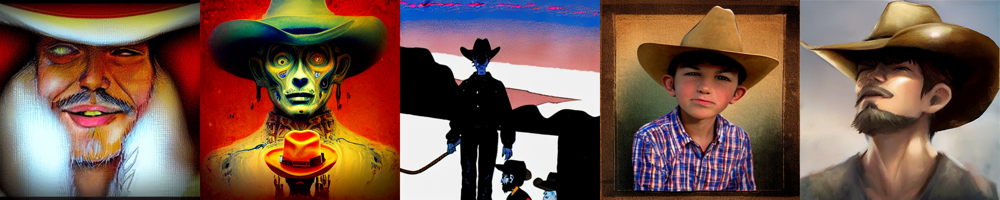

In [12]:
# after loss is applied
latents_collect = []
loss_type = 'symmetry'
for seed_no,sd in zip(seed_list,sdconcepts):
    
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()
    
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)
    
# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

# Images with saturation loss applied every 5 step


  0%|          | 0/50 [00:00<?, ?it/s]

loss 48.8125


 10%|█         | 5/50 [01:02<04:51,  6.47s/it]

loss 34.6875


 20%|██        | 10/50 [01:30<03:52,  5.82s/it]

loss 23.671875


 30%|███       | 15/50 [01:48<01:39,  2.86s/it]

loss 18.734375


 40%|████      | 20/50 [02:07<01:12,  2.43s/it]

loss 19.5


 50%|█████     | 25/50 [02:21<00:54,  2.16s/it]

loss 20.1875


 60%|██████    | 30/50 [02:32<00:35,  1.76s/it]

loss 18.96875


 70%|███████   | 35/50 [02:41<00:20,  1.38s/it]

loss 18.5625


 80%|████████  | 40/50 [02:50<00:13,  1.36s/it]

loss 17.984375


 90%|█████████ | 45/50 [02:59<00:07,  1.41s/it]

loss 17.4375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 42.1875


 10%|█         | 5/50 [00:08<00:59,  1.33s/it]

loss 38.46875


 20%|██        | 10/50 [00:17<00:58,  1.45s/it]

loss 36.59375


 30%|███       | 15/50 [00:28<00:54,  1.56s/it]

loss 26.296875


 40%|████      | 20/50 [00:37<00:41,  1.37s/it]

loss 23.125


 50%|█████     | 25/50 [00:46<00:34,  1.36s/it]

loss 22.15625


 60%|██████    | 30/50 [00:55<00:30,  1.52s/it]

loss 21.5


 70%|███████   | 35/50 [01:04<00:20,  1.36s/it]

loss 21.125


 80%|████████  | 40/50 [01:12<00:13,  1.37s/it]

loss 20.0


 90%|█████████ | 45/50 [01:22<00:07,  1.56s/it]

loss 19.859375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 57.96875


 10%|█         | 5/50 [00:11<01:07,  1.51s/it]

loss 31.109375


 20%|██        | 10/50 [00:21<01:04,  1.61s/it]

loss 28.484375


 30%|███       | 15/50 [00:36<01:07,  1.93s/it]

loss 25.8125


 40%|████      | 20/50 [00:45<00:44,  1.49s/it]

loss 24.046875


 50%|█████     | 25/50 [00:55<00:36,  1.46s/it]

loss 23.90625


 60%|██████    | 30/50 [01:04<00:27,  1.38s/it]

loss 23.171875


 70%|███████   | 35/50 [01:46<01:10,  4.73s/it]

loss 22.34375


 80%|████████  | 40/50 [02:06<00:28,  2.89s/it]

loss 21.734375


 90%|█████████ | 45/50 [02:16<00:09,  1.81s/it]

loss 21.265625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 58.25


 10%|█         | 5/50 [00:10<01:07,  1.49s/it]

loss 32.875


 20%|██        | 10/50 [00:20<00:55,  1.39s/it]

loss 23.25


 30%|███       | 15/50 [00:30<00:56,  1.62s/it]

loss 19.84375


 40%|████      | 20/50 [01:07<01:42,  3.41s/it]

loss 17.703125


 50%|█████     | 25/50 [01:36<01:53,  4.53s/it]

loss 16.34375


 60%|██████    | 30/50 [01:54<00:54,  2.72s/it]

loss 15.609375


 70%|███████   | 35/50 [02:13<00:38,  2.58s/it]

loss 15.3046875


 80%|████████  | 40/50 [02:27<00:23,  2.32s/it]

loss 15.21875


 90%|█████████ | 45/50 [02:55<00:16,  3.31s/it]

loss 15.3203125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 58.875


 10%|█         | 5/50 [00:09<01:05,  1.45s/it]

loss 47.875


 20%|██        | 10/50 [00:18<00:54,  1.37s/it]

loss 39.125


 30%|███       | 15/50 [00:25<00:44,  1.27s/it]

loss 34.3125


 40%|████      | 20/50 [00:36<00:46,  1.56s/it]

loss 29.828125


 50%|█████     | 25/50 [00:46<00:36,  1.47s/it]

loss 28.734375


 60%|██████    | 30/50 [00:53<00:24,  1.22s/it]

loss 27.875


 70%|███████   | 35/50 [01:00<00:19,  1.28s/it]

loss 27.15625


 80%|████████  | 40/50 [01:10<00:14,  1.41s/it]

loss 26.984375


 90%|█████████ | 45/50 [01:19<00:06,  1.36s/it]

loss 27.25


100%|██████████| 50/50 [01:27<00:00,  1.74s/it]


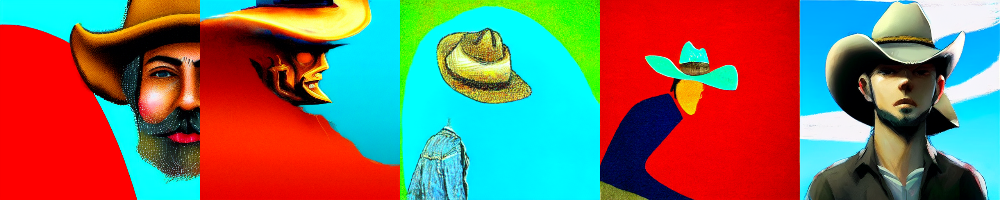

In [13]:
# after loss is applied
latents_collect = []
loss_type = 'saturation'
for seed_no,sd in zip(seed_list,sdconcepts):
    
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()
    
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)
    
# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

# Images with blue loss applied every 5 step

  0%|          | 0/50 [00:00<?, ?it/s]

loss 119.0625


 10%|█         | 5/50 [04:35<36:54, 49.21s/it]  

loss 42.40625


 20%|██        | 10/50 [08:00<27:17, 40.94s/it]

loss 27.875


 30%|███       | 15/50 [12:14<25:10, 43.16s/it]

loss 25.296875


 40%|████      | 20/50 [16:45<21:45, 43.52s/it]

loss 19.46875


 50%|█████     | 25/50 [19:23<11:40, 28.00s/it]

loss 16.03125


 60%|██████    | 30/50 [22:03<08:57, 26.88s/it]

loss 14.0390625


 70%|███████   | 35/50 [25:25<08:55, 35.71s/it]

loss 12.765625


 80%|████████  | 40/50 [28:07<04:48, 28.86s/it]

loss 11.953125


 90%|█████████ | 45/50 [30:52<02:13, 26.66s/it]

loss 11.359375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 167.375


 10%|█         | 5/50 [04:31<39:52, 53.16s/it]

loss 52.4375


 20%|██        | 10/50 [08:16<28:07, 42.19s/it]

loss 37.21875


 30%|███       | 15/50 [13:11<28:28, 48.81s/it]

loss 26.53125


 40%|████      | 20/50 [16:34<18:05, 36.19s/it]

loss 23.75


 50%|█████     | 25/50 [19:34<13:57, 33.48s/it]

loss 22.015625


 60%|██████    | 30/50 [22:22<10:06, 30.31s/it]

loss 20.890625


 70%|███████   | 35/50 [25:43<08:31, 34.13s/it]

loss 20.296875


 80%|████████  | 40/50 [28:32<04:52, 29.25s/it]

loss 19.875


 90%|█████████ | 45/50 [31:29<02:38, 31.79s/it]

loss 19.625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 86.375


 10%|█         | 5/50 [03:33<27:12, 36.29s/it]

loss 57.1875


 20%|██        | 10/50 [07:23<28:35, 42.89s/it]

loss 47.0625


 30%|███       | 15/50 [11:11<24:59, 42.86s/it]

loss 41.84375


 40%|████      | 20/50 [15:55<24:39, 49.32s/it]

loss 38.34375


 50%|█████     | 25/50 [19:38<16:48, 40.35s/it]

loss 35.5


 60%|██████    | 30/50 [22:45<10:55, 32.76s/it]

loss 32.84375


 70%|███████   | 35/50 [25:52<07:42, 30.84s/it]

loss 31.984375


 80%|████████  | 40/50 [29:38<06:01, 36.14s/it]

loss 31.390625


 90%|█████████ | 45/50 [32:45<02:53, 34.63s/it]

loss 31.15625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 128.375


 10%|█         | 5/50 [02:53<23:47, 31.73s/it]

loss 48.65625


 20%|██        | 10/50 [05:58<21:10, 31.76s/it]

loss 29.5


 30%|███       | 15/50 [08:59<18:32, 31.79s/it]

loss 26.515625


 40%|████      | 20/50 [27:46<1:03:37, 127.24s/it]

loss 24.90625


 50%|█████     | 25/50 [29:41<14:48, 35.55s/it]   

loss 23.75


 60%|██████    | 30/50 [30:37<03:48, 11.41s/it]

loss 22.84375


 70%|███████   | 35/50 [32:01<03:37, 14.51s/it]

loss 22.1875


 80%|████████  | 40/50 [32:59<01:19,  7.93s/it]

loss 21.875


 90%|█████████ | 45/50 [33:42<00:28,  5.73s/it]

loss 22.0625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 108.3125


 10%|█         | 5/50 [01:00<05:08,  6.85s/it]

loss 32.21875


 20%|██        | 10/50 [02:47<10:37, 15.95s/it]

loss 24.859375


 30%|███       | 15/50 [03:49<05:51, 10.04s/it]

loss 23.453125


 40%|████      | 20/50 [04:32<03:11,  6.38s/it]

loss 23.984375


 50%|█████     | 25/50 [05:20<02:51,  6.85s/it]

loss 23.359375


 60%|██████    | 30/50 [06:38<03:42, 11.15s/it]

loss 21.9375


 70%|███████   | 35/50 [08:13<03:54, 15.62s/it]

loss 21.3125


 80%|████████  | 40/50 [09:20<01:56, 11.61s/it]

loss 20.75


 90%|█████████ | 45/50 [10:16<00:39,  7.94s/it]

loss 20.625


100%|██████████| 50/50 [11:31<00:00, 13.83s/it]


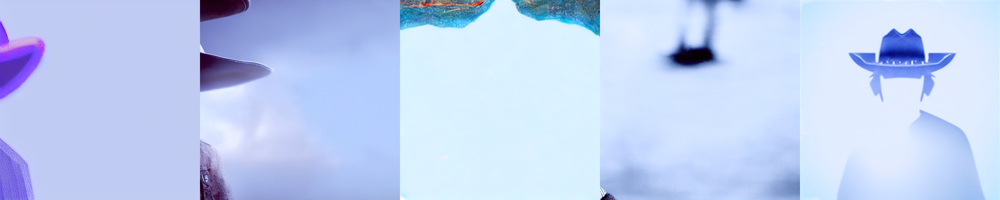

In [14]:
# after loss is applied
latents_collect = []
loss_type = 'blue'
for seed_no,sd in zip(seed_list,sdconcepts):
    
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()
    
    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)
    
# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))